In [2]:
import matplotlib
import matplotlib.pyplot as plt
import pathlib
import mne

In [3]:
# use this can show graph in new page!
# useful!
# matplotlib.use('Qt5Agg')

In [4]:
# data_folder = mne.datasets.sample.data_path('OpenMIIR-RawEEG_v1')
# data_raw_file = os.path.join(data_folder, 'MEG', 'sample',
#                                     'P01-raw.fif')
fname = 'OpenMIIR-RawEEG_v1/P01-raw.fif'
raw = mne.io.read_raw_fif(fname, preload=True)
raw

Opening raw data file OpenMIIR-RawEEG_v1/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...


<Raw | P01-raw.fif, 69 x 2478166 (4840.2 s), ~1.27 GB, data loaded>

Using matplotlib as 2D backend.


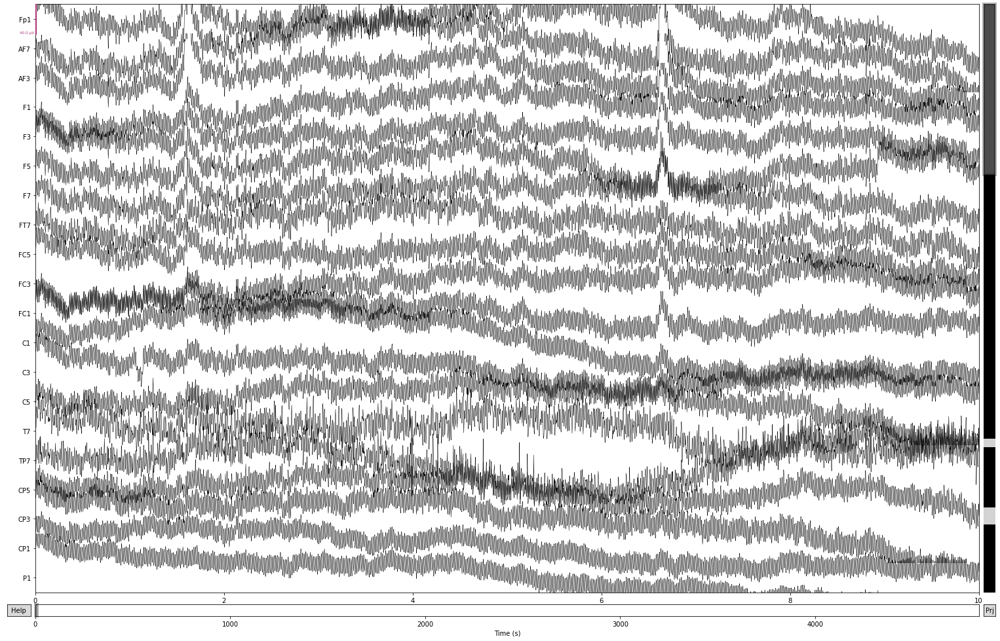

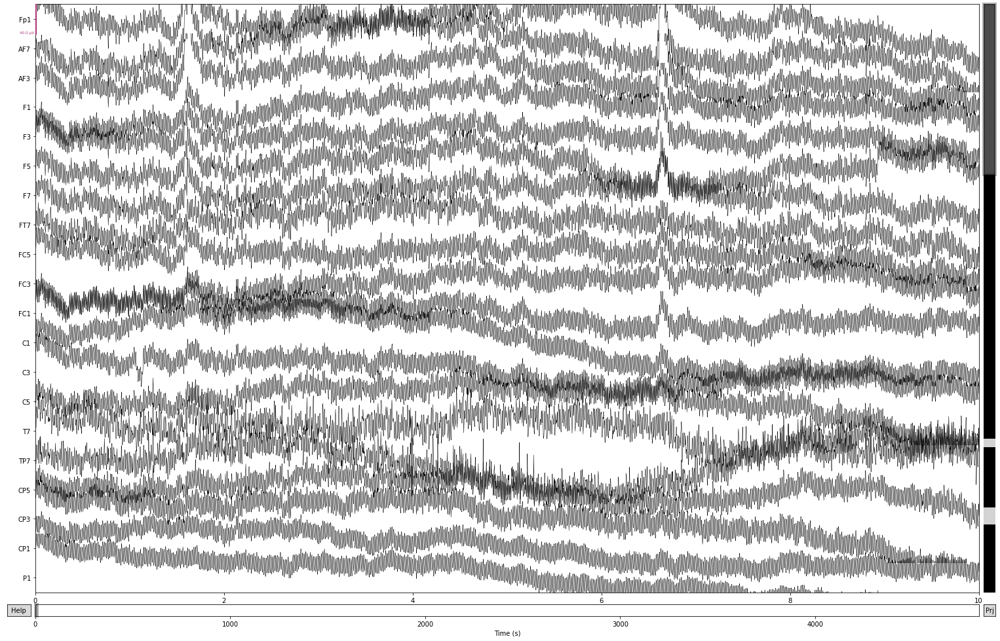

In [4]:
raw.plot()

In [5]:
len(raw)

2478166

In [5]:
events = mne.find_events(raw) # 51 IDs

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


C:\Users\87678\AppData\Local\Temp\ipykernel_5104\2068850291.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(events)


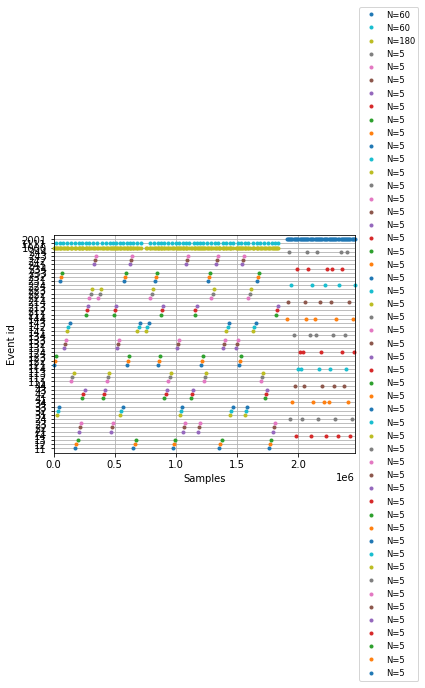

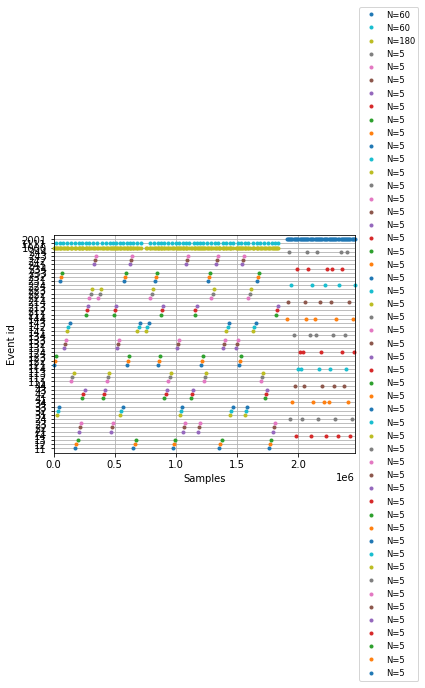

In [7]:
# show events graph
mne.viz.plot_events(events)

In [8]:
for e in events:
  print(e)

[512   0 121]
[ 520    0 1000]
[8141    0  122]
[8147    0 1000]
[16517     0   123]
[21566     0  1111]
[21749     0  1000]
[25446     0    31]
[25451     0  1000]
[34388     0    32]
[34394     0  1000]
[43873     0    33]
[50033     0  1111]
[50214     0  1000]
[53915     0   231]
[53921     0  1000]
[62598     0   232]
[62604     0  1000]
[71861     0   233]
[77789     0  1111]
[77964     0  1000]
[81669     0   131]
[81674     0  1000]
[90083     0   132]
[90089     0  1000]
[99227     0   133]
[105045      0   1111]
[105203      0   1000]
[108933      0    141]
[108938      0   1000]
[119460      0    142]
[119467      0   1000]
[130601      0    143]
[138414      0   1111]
[138590      0   1000]
[142308      0    111]
[142313      0   1000]
[153104      0    112]
[153110      0   1000]
[164415      0    113]
[172399      0   1111]
[172557      0   1000]
[176282      0     11]
[176289      0   1000]
[186558      0     12]
[186564      0   1000]
[197572      0     13]
[205258     

## Visualize the sensor locations

Creating RawArray with float64 data, n_channels=64, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


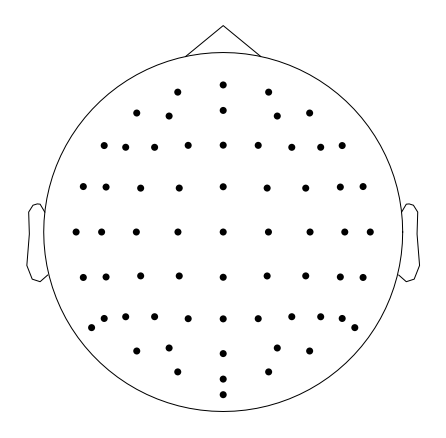

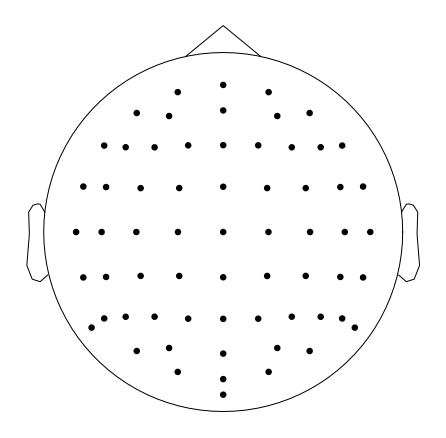

In [6]:
# standard
biosemi_montage = mne.channels.make_standard_montage('biosemi64')
biosemi_montage.plot(show_names=False)

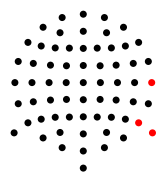

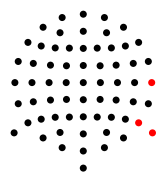

In [7]:
fig = plt.figure()
ax2d = fig.add_subplot(121)
raw.plot_sensors(ch_type='eeg', axes=ax2d)
# raw.plot_sensors(ch_type='eeg')
# raw.plot(kind='topomap', show_names=False)

## Basic filter

In [8]:
raw_eeg = raw.copy().filter(l_freq=0.1, h_freq=60)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 16897 samples (33.002 sec)



## use ica filter eye blink

In [9]:
ica = mne.preprocessing.ICA(n_components=20, random_state=0)

In [10]:
ica.fit(raw_eeg.copy().filter(8,35))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 35 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 35.00 Hz
- Upper transition bandwidth: 8.75 Hz (-6 dB cutoff frequency: 39.38 Hz)
- Filter length: 845 samples (1.650 sec)

Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 49.4s.


Method,fastica
Fit,26 iterations on raw data (2478166 samples)
ICA components,20
Explained variance,92.2 %
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


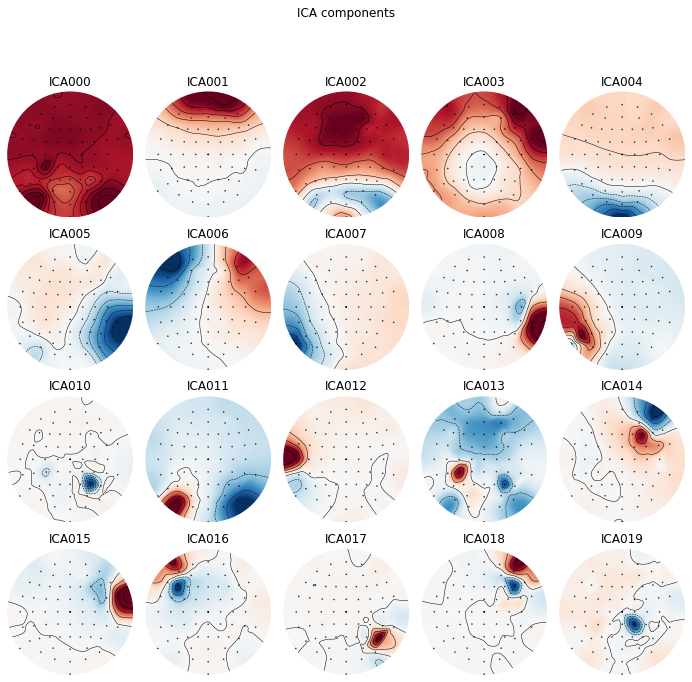

[<MNEFigure size 702x696.24 with 20 Axes>]

In [11]:
ica.plot_components()

In [23]:
# store bad components in ica object
ica.exclude = [0,1,2,3,5,10]

In [19]:
bad_idx, scores = ica.find_bads_eog(raw_eeg, threshold=2)
print(bad_idx)

Using EOG channels: EXG1, EXG2, EXG3, EXG4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff f

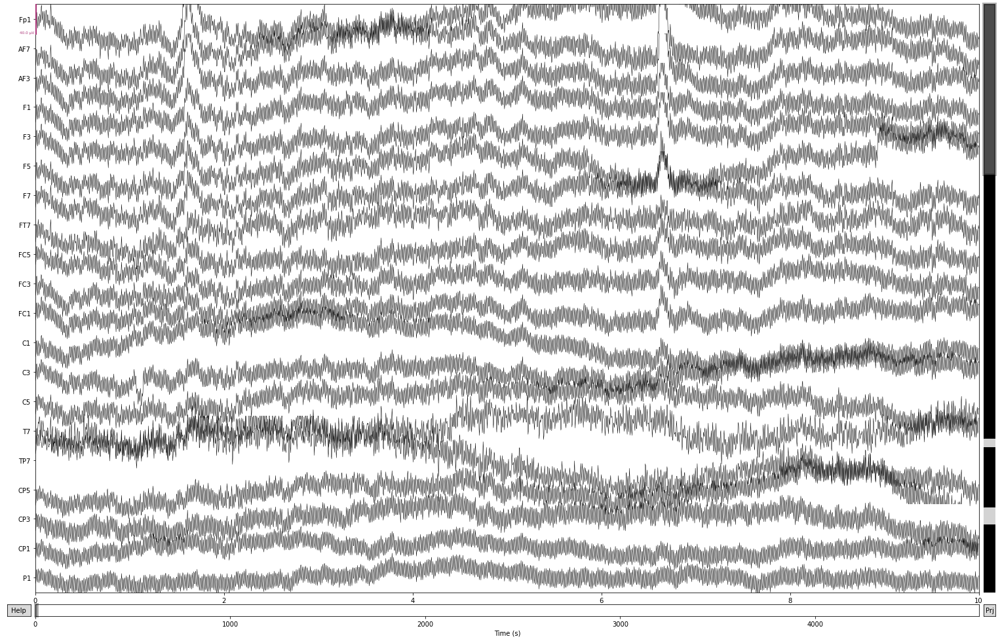

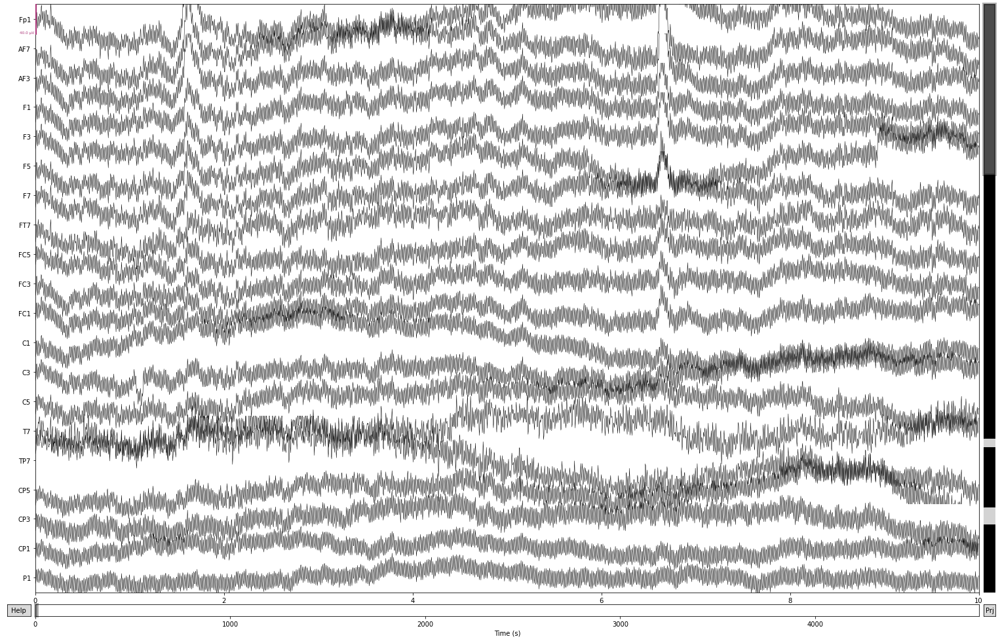

In [20]:
raw_eeg.plot()

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 6 ICA components
    Projecting back using 61 PCA components


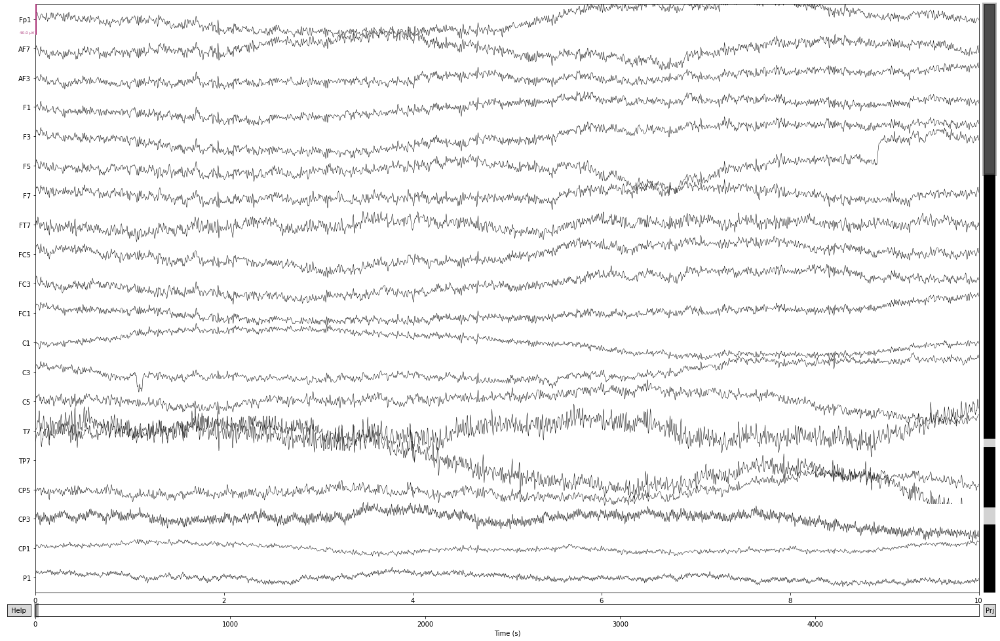

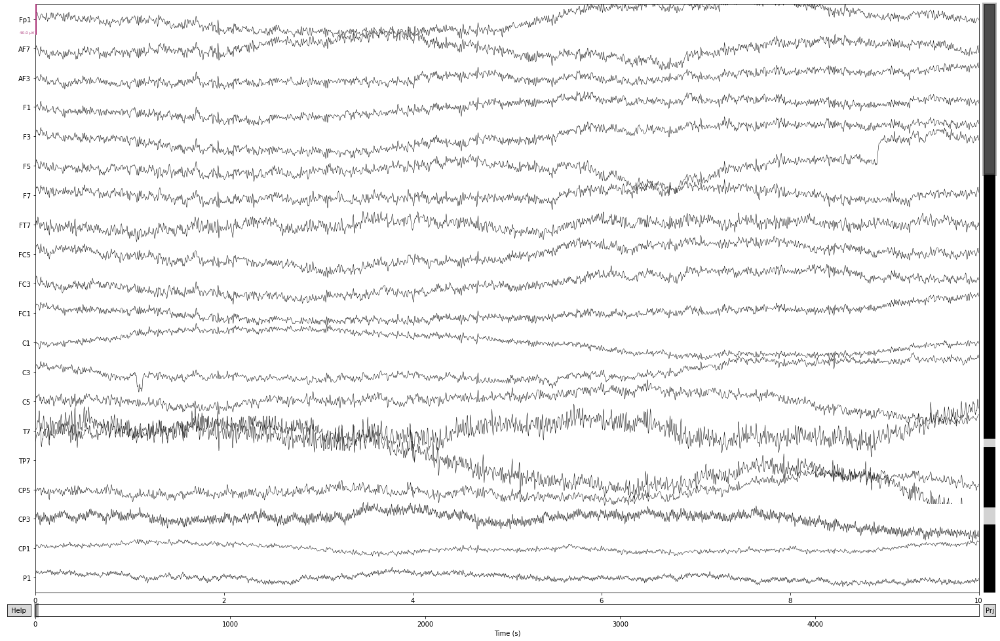

In [24]:
ica.apply(raw_eeg.copy(), exclude=ica.exclude).plot()

In [33]:
epochs = mne.Epochs(raw_eeg,events, preload=True)


Not setting metadata
Not setting metadata
540 matching events found
Setting baseline interval to [-0.19921875, 0.0] sec
Applying baseline correction (mode: mean)
1 projection items activated
Loading data for 540 events and 359 original time points ...
0 bad epochs dropped


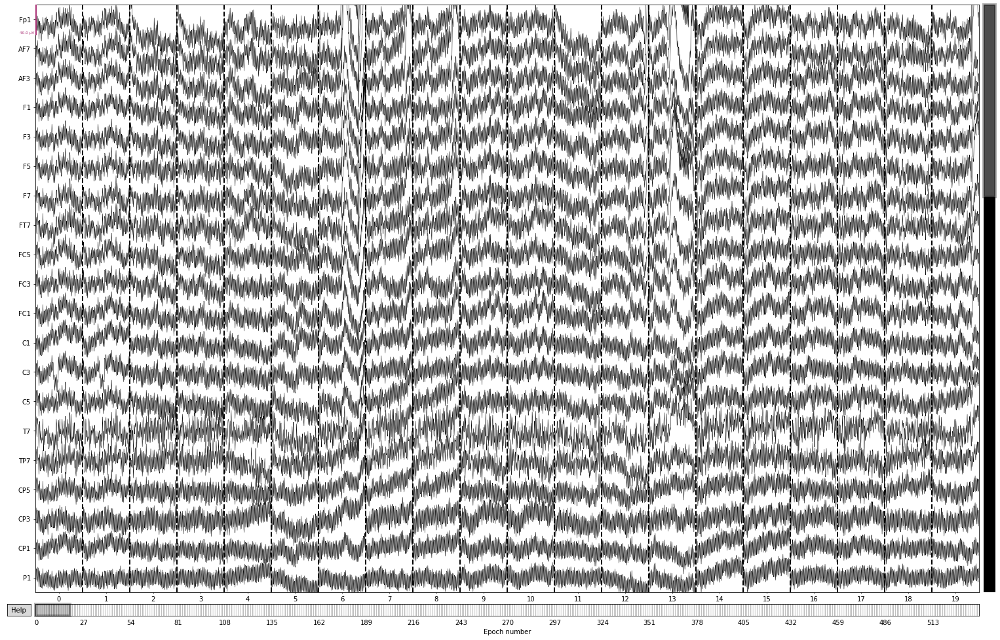

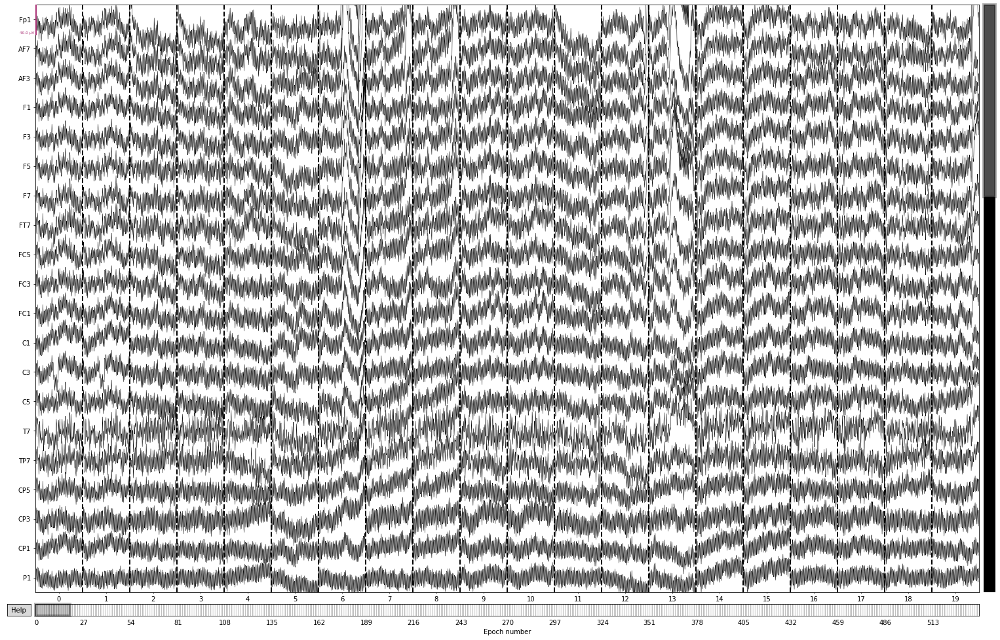

In [34]:
epochs.plot()

In [35]:
epochs = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 6 ICA components
    Projecting back using 61 PCA components


C:\Users\87678\AppData\Local\Temp\ipykernel_5104\3077353632.py:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs = ica.apply(epochs, exclude=ica.exclude)


In [36]:
epochs = mne.Epochs(raw_eeg, events, preload=True)
epochs = ica.apply(epochs, exclude=ica.exclude)

Not setting metadata
Not setting metadata
540 matching events found
Setting baseline interval to [-0.19921875, 0.0] sec
Applying baseline correction (mode: mean)
1 projection items activated
Loading data for 540 events and 359 original time points ...
0 bad epochs dropped
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 6 ICA components
    Projecting back using 61 PCA components


C:\Users\87678\AppData\Local\Temp\ipykernel_5104\4117509164.py:2: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs = ica.apply(epochs, exclude=ica.exclude)


Not setting metadata
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


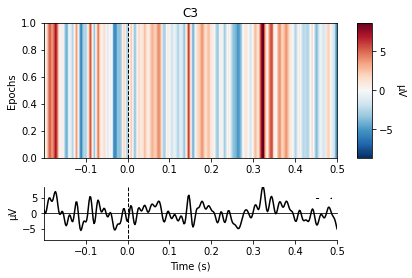

[<Figure size 432x288 with 4 Axes>]

In [40]:
epochs[3].plot_image(picks=[12])

In [41]:
test = epochs[0].average()

Removing projector <Projection | Average EEG reference, active : True, n_channels : 64>


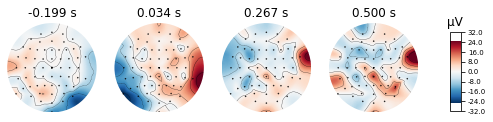

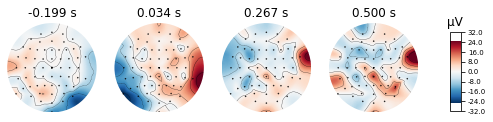

In [43]:
test.plot_topomap()

No projector specified for this dataset. Please consider the method self.add_proj.


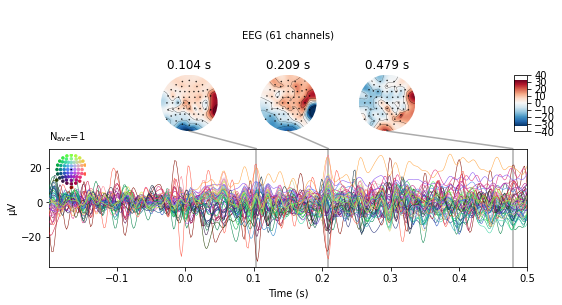

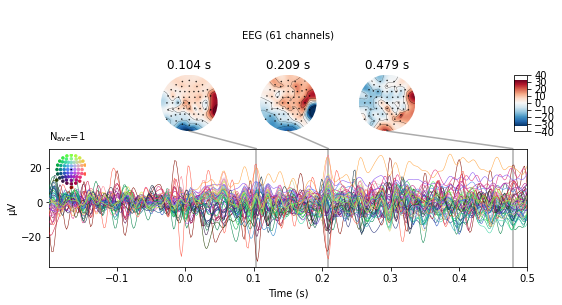

In [44]:
test.plot_joint()

In [ ]:
len(raw_eeg)